In [1]:
#Imports 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sqlalchemy import create_engine
from sklearn.model_selection import train_test_split
import pymysql
import pandas_profiling
import statsmodels.api as sm


# Cargue la base de datos desde la tabla Prestamos de la base de datos Empresa alojada en un servidor MySQL. 


In [2]:
#Creando conexión

ADDRESS = '*****'  
PORT = '*****'
USERNAME = '*****' 
PASSWORD = '*****' 
DBNAME = '*****' 
#A long string that contains the necessary Postgres login information
mysql_str = ('mysql+pymysql://{username}:{password}@{ipaddress}:{port}/{dbname}'.format(
                                                                                        username=USERNAME,
                                                                                        password=PASSWORD,
                                                                                        ipaddress=ADDRESS,
                                                                                        port=PORT,
                                                                                        dbname=DBNAME))

cnx = create_engine(mysql_str)

#Leyendo data 
df = pd.read_sql_query('''SELECT * FROM Prestamos''', cnx)
df.drop(columns='index', inplace=True)

In [3]:
df

,Mora_90_02,Porcentaje_Linea,Edad,VecesMora30_59,PorcentajeDeuda,Ingreso,Cantidad_Creditos,PagoMora90,Cantidad_Hipotecarios,VecesMora60_89,Cargas
0,1,0.766127,45,2,0.802982,9120.0,13,0,6,0,2.0
1,0,0.957151,40,0,0.121876,2600.0,4,0,0,0,1.0
2,0,0.658180,38,1,0.085113,3042.0,2,1,0,0,0.0
3,0,0.233810,30,0,0.036050,3300.0,5,0,0,0,0.0
4,0,0.907239,49,1,0.024926,63588.0,7,0,1,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
149995,0,0.040674,74,0,0.225131,2100.0,4,0,1,0,0.0
149996,0,0.299745,44,0,0.716562,5584.0,4,0,1,0,2.0
149997,0,0.246044,58,0,3870.000000,NaN,18,0,1,0,0.0
149998,0,0.000000,30,0,0.000000,5716.0,4,0,0,0,0.0


# Aparte un 30% al azar de los datos del archivo en un archivo aparte para ser utilizado como test.

In [4]:
# Definiendo variable a predecir (y) y variables independientes (X)
y = df['Mora_90_02']
X = df.drop(columns= 'Mora_90_02')

# Creando set de entrenamiento y testeo
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3, random_state=1)

# Agregue un método que grafique densidades y las guarde en una carpeta llamada Analisis en la raíz de su proyecto, así como también guarde un resumen de estadísticos descriptivos (media, mediana, desviación estándar, asimetría). A partir de los resultados obtenidos ¿Qué variables requieren ser transformadas?


In [5]:
# Graficando densidades y boxplots

def graficar_densidades_boxplots(df):
    
    #Definiendo dimensiones de la figura
    a = len(df.columns)  
    b = 2  
    c = 1  

    fig = plt.figure(figsize=(20,60))
    
    #Graficando las densidades y boxplots de cada variable
    for i in df.columns:
        plt.subplot(a, b, c)
        plt.title('{} (dist), subplot: {}{}{}'.format(i, a, b, c))
        plt.xlabel(i)
        sns.distplot(df[i])
        c = c + 1

        plt.subplot(a, b, c)
        plt.title('{} (box), subplot: {}{}{}'.format(i, a, b, c))
        plt.xlabel(i)
        plt.boxplot(x = df[i])
        c = c + 1

    #Guardando gráficos en la carpeta Analisis
    plt.savefig('../Analisis/graficos.jpg')
    return fig

/Users/santiagochiesa/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/santiagochiesa/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/santiagochiesa/.pyenv/versions/3.8.12/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use eith

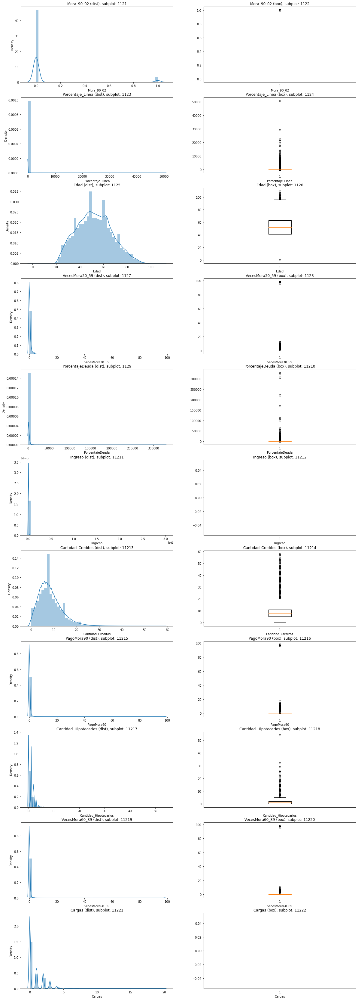

In [6]:
graficar_densidades_boxplots(df)

In [7]:
def estadisticos_descriptivos(df):
    
    # Calculando algunos estadísticos descriptivos
    df_description = pd.DataFrame(df.describe())

    # Calculando medianas
    median = pd.DataFrame(df.median()).T.rename(index={0:'median'})

    # Calculando asimetrías
    skew = pd.DataFrame(df.skew()).T.rename(index={0:'skew'})

    # Uniendo estadísticos descriptivos en una sola tabla
    df_description = df_description.append([median, skew])

    # Exportando tabla de estadísticos descriptivos a csv
    df_description.to_csv('../Analisis/estadisticos_descriptivos.csv')
    
    return df_description

In [8]:
estadisticos_descriptivos(df)

,Mora_90_02,Porcentaje_Linea,Edad,VecesMora30_59,PorcentajeDeuda,Ingreso,Cantidad_Creditos,PagoMora90,Cantidad_Hipotecarios,VecesMora60_89,Cargas
count,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,1.202690e+05,150000.000000,150000.000000,150000.000000,150000.000000,146076.000000
mean,0.066840,6.048438,52.295207,0.421033,353.005076,6.670221e+03,8.452760,0.265973,1.018240,0.240387,0.757222
std,0.249746,249.755371,14.771866,4.192781,2037.818523,1.438467e+04,5.145951,4.169304,1.129771,4.155179,1.115086
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029867,41.000000,0.000000,0.175074,3.400000e+03,5.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.559046,63.000000,0.000000,0.868254,8.249000e+03,11.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,109.000000,98.000000,329664.000000,3.008750e+06,58.000000,98.000000,54.000000,98.000000,20.000000
median,0.000000,0.154181,52.000000,0.000000,0.366508,5.400000e+03,8.000000,0.000000,1.000000,0.000000,0.000000
skew,3.468857,97.631574,0.188995,22.597108,95.157793,1.140403e+02,1.215314,23.087345,3.482484,23.331743,1.588242


In [9]:
# Alternativa generando un reporte con profile_report
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Las variables que requieren ser transformadas son:

'Porcentaje_Linea', 'VecesMora30_59', 'PorcentajeDeuda', 'Ingreso', 'Cantidad_Creditos', 'PagoMora90', 'Cantidad_Hipotecarios', 'VecesMora60_89' y 'Cargas'. 

Esto se debe a que presentan una gran asimetría (skew).

# Cree un método que transforme las variables a logaritmo y aplique sobre las variables que deberían ser transformadas.

In [10]:
def log_transform(data, variable):
    # Aplicar logaritmo al valor +1 dado que tenemos valores igual a cero
    data[variable] = data[variable].apply(lambda x: np.log(x+1))
    return variable

In [11]:
# Transformamos las variables que requieren ser transformadas
a_transformar = ['Porcentaje_Linea', 'VecesMora30_59',
       'PorcentajeDeuda', 'Ingreso', 'Cantidad_Creditos', 'PagoMora90',
       'Cantidad_Hipotecarios', 'VecesMora60_89', 'Cargas']

In [12]:
for i in a_transformar:
    log_transform(df, i)

In [13]:
df

,Mora_90_02,Porcentaje_Linea,Edad,VecesMora30_59,PorcentajeDeuda,Ingreso,Cantidad_Creditos,PagoMora90,Cantidad_Hipotecarios,VecesMora60_89,Cargas
0,1,0.568789,45,1.098612,0.589442,9.118335,2.639057,0.000000,1.945910,0.0,1.098612
1,0,0.671490,40,0.000000,0.115002,7.863651,1.609438,0.000000,0.000000,0.0,0.693147
2,0,0.505721,38,0.693147,0.081684,8.020599,1.098612,0.693147,0.000000,0.0,0.000000
3,0,0.210107,30,0.000000,0.035415,8.101981,1.791759,0.000000,0.000000,0.0,0.000000
4,0,0.645657,49,0.693147,0.024620,11.060196,2.079442,0.000000,0.693147,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
149995,0,0.039868,74,0.000000,0.203048,7.650169,1.609438,0.000000,0.693147,0.0,0.000000
149996,0,0.262168,44,0.000000,0.540324,8.627840,1.609438,0.000000,0.693147,0.0,1.098612
149997,0,0.219974,58,0.000000,8.261268,NaN,2.944439,0.000000,0.693147,0.0,0.000000
149998,0,0.000000,30,0.000000,0.000000,8.651199,1.609438,0.000000,0.000000,0.0,0.000000


In [14]:
# Examinamos la asimetría de las variables transformadas
pd.DataFrame(df.skew()).T.rename(index={0:'skew'})

,Mora_90_02,Porcentaje_Linea,Edad,VecesMora30_59,PorcentajeDeuda,Ingreso,Cantidad_Creditos,PagoMora90,Cantidad_Hipotecarios,VecesMora60_89,Cargas
skew,3.468857,11.704798,0.188995,4.272123,1.749013,-4.36472,-0.733081,8.810639,0.238833,10.605853,0.83593


# Ajuste un modelo de regresión logística, un random forest, un catboost y un modelo de su elección.


In [15]:
# Repitiendo el proceso de separación del dataset en set de entrenamiento y testeo, ya que los datos cambiaron.

# Definiendo variable a predecir (y) y variables independientes (X)
y = df['Mora_90_02']
X = df.drop(columns= 'Mora_90_02')

# Creando set de entrenamiento y testeo
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3, random_state=1)

In [16]:
# Examinando valores nulos
df.isna().sum() / len(df)

Mora_90_02               0.000000
Porcentaje_Linea         0.000000
Edad                     0.000000
VecesMora30_59           0.000000
PorcentajeDeuda          0.000000
Ingreso                  0.198207
Cantidad_Creditos        0.000000
PagoMora90               0.000000
Cantidad_Hipotecarios    0.000000
VecesMora60_89           0.000000
Cargas                   0.026160
dtype: float64

In [17]:
# Reemplazando valores nulos por el valor promedio

from sklearn.impute import SimpleImputer

# Variable 'Ingreso'

# Datos de entrenamiento

imputer = SimpleImputer(strategy="mean") 

imputer.fit(X_train[['Ingreso']]) 

X_train['Ingreso'] = imputer.transform(X_train[['Ingreso']]) 


# Datos de testeo

imputer = SimpleImputer(strategy="mean") 

imputer.fit(X_test[['Ingreso']]) 

X_test['Ingreso'] = imputer.transform(X_test[['Ingreso']]) 


# Variable 'Cargas'

from sklearn.impute import SimpleImputer

# Datos de entrenamiento

imputer = SimpleImputer(strategy="most_frequent") 

imputer.fit(X_train[['Cargas']]) 

X_train['Cargas'] = imputer.transform(X_train[['Cargas']]) 


# Datos de testeo

imputer = SimpleImputer(strategy="most_frequent") 

imputer.fit(X_test[['Cargas']]) 

X_test['Cargas'] = imputer.transform(X_test[['Cargas']]) 


/var/folders/11/ztlnhtbd1ybf3b30btq3m8fw0000gn/T/ipykernel_22219/394596727.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train['Ingreso'] = imputer.transform(X_train[['Ingreso']])
/var/folders/11/ztlnhtbd1ybf3b30btq3m8fw0000gn/T/ipykernel_22219/394596727.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_test['Ingreso'] = imputer.transform(X_test[['Ingreso']])
/var/folders/11/ztlnhtbd1ybf3b30btq3m8fw0000gn/T/ipykernel_22219/394596727.py:35: SettingWithCopyWarning: 
A value is trying to be set o

In [18]:
# Escalando datos
from sklearn.preprocessing import RobustScaler

# Re-Escalando data de entrenamiento
scaler = RobustScaler() 

scaler.fit(X_train) 
X_train = scaler.transform(X_train) 

# Escalando data de testeo
X_test = scaler.transform(X_test) 


In [19]:
# Implementando modelo de Regresión logística


from sklearn.linear_model import LogisticRegression



# Entrenando modelo
logreg_model = LogisticRegression() 
logreg_model.fit(X_train, y_train) 


# Prediciendo
logreg_class_preds = logreg_model.predict(X_test)
logreg_prob_preds = logreg_model.predict_proba(X_test)

In [20]:
# Implementando modelo de Random Forest

from sklearn.ensemble import RandomForestClassifier

# Entrenando modelo
rf_model = RandomForestClassifier() 
rf_model.fit(X_train, y_train) 


# Prediciendo
rf_class_preds = rf_model.predict(X_test)
rf_prob_preds = rf_model.predict_proba(X_test)

In [21]:
# Implementando modelo de Catboost

from catboost import CatBoostClassifier

# Entrenando modelo
cb_model = CatBoostClassifier(loss_function='Logloss')
cb_model.fit(X_train, y_train) 


# Prediciendo
cb_class_preds = cb_model.predict(X_test)
cb_prob_preds = cb_model.predict_proba(X_test)

Learning rate set to 0.075159
0:	learn: 0.5932863	total: 76ms	remaining: 1m 15s
1:	learn: 0.5109756	total: 81.5ms	remaining: 40.6s
2:	learn: 0.4466510	total: 86.9ms	remaining: 28.9s
3:	learn: 0.3919234	total: 93.9ms	remaining: 23.4s
4:	learn: 0.3514991	total: 102ms	remaining: 20.3s
5:	learn: 0.3226209	total: 109ms	remaining: 18.1s
6:	learn: 0.2958315	total: 117ms	remaining: 16.6s
7:	learn: 0.2750319	total: 125ms	remaining: 15.5s
8:	learn: 0.2589502	total: 133ms	remaining: 14.6s
9:	learn: 0.2465624	total: 140ms	remaining: 13.9s
10:	learn: 0.2357809	total: 148ms	remaining: 13.3s
11:	learn: 0.2281169	total: 156ms	remaining: 12.9s
12:	learn: 0.2210267	total: 164ms	remaining: 12.5s
13:	learn: 0.2143551	total: 172ms	remaining: 12.1s
14:	learn: 0.2093631	total: 180ms	remaining: 11.8s
15:	learn: 0.2048374	total: 188ms	remaining: 11.6s
16:	learn: 0.2012524	total: 196ms	remaining: 11.3s
17:	learn: 0.1986706	total: 205ms	remaining: 11.2s
18:	learn: 0.1961543	total: 213ms	remaining: 11s
19:	learn:

165:	learn: 0.1719482	total: 1.4s	remaining: 7.01s
166:	learn: 0.1719104	total: 1.4s	remaining: 7s
167:	learn: 0.1718772	total: 1.41s	remaining: 6.99s
168:	learn: 0.1718422	total: 1.42s	remaining: 6.99s
169:	learn: 0.1718197	total: 1.43s	remaining: 6.99s
170:	learn: 0.1717663	total: 1.44s	remaining: 6.98s
171:	learn: 0.1717483	total: 1.45s	remaining: 6.97s
172:	learn: 0.1716966	total: 1.46s	remaining: 6.96s
173:	learn: 0.1716538	total: 1.46s	remaining: 6.95s
174:	learn: 0.1716092	total: 1.47s	remaining: 6.94s
175:	learn: 0.1715820	total: 1.48s	remaining: 6.92s
176:	learn: 0.1715370	total: 1.49s	remaining: 6.91s
177:	learn: 0.1715170	total: 1.49s	remaining: 6.9s
178:	learn: 0.1714775	total: 1.5s	remaining: 6.88s
179:	learn: 0.1714224	total: 1.51s	remaining: 6.87s
180:	learn: 0.1713627	total: 1.52s	remaining: 6.86s
181:	learn: 0.1713303	total: 1.52s	remaining: 6.86s
182:	learn: 0.1713016	total: 1.53s	remaining: 6.84s
183:	learn: 0.1712578	total: 1.54s	remaining: 6.83s
184:	learn: 0.17121

340:	learn: 0.1662161	total: 2.78s	remaining: 5.38s
341:	learn: 0.1661820	total: 2.79s	remaining: 5.37s
342:	learn: 0.1661474	total: 2.8s	remaining: 5.36s
343:	learn: 0.1661200	total: 2.81s	remaining: 5.35s
344:	learn: 0.1660790	total: 2.81s	remaining: 5.34s
345:	learn: 0.1660612	total: 2.82s	remaining: 5.34s
346:	learn: 0.1660283	total: 2.83s	remaining: 5.33s
347:	learn: 0.1660045	total: 2.84s	remaining: 5.32s
348:	learn: 0.1659815	total: 2.85s	remaining: 5.31s
349:	learn: 0.1659478	total: 2.86s	remaining: 5.31s
350:	learn: 0.1659193	total: 2.87s	remaining: 5.3s
351:	learn: 0.1659046	total: 2.87s	remaining: 5.29s
352:	learn: 0.1658611	total: 2.88s	remaining: 5.28s
353:	learn: 0.1658365	total: 2.89s	remaining: 5.27s
354:	learn: 0.1658001	total: 2.9s	remaining: 5.27s
355:	learn: 0.1657728	total: 2.91s	remaining: 5.26s
356:	learn: 0.1657316	total: 2.91s	remaining: 5.25s
357:	learn: 0.1657108	total: 2.92s	remaining: 5.24s
358:	learn: 0.1656777	total: 2.93s	remaining: 5.23s
359:	learn: 0.1

518:	learn: 0.1618689	total: 4.19s	remaining: 3.88s
519:	learn: 0.1618338	total: 4.2s	remaining: 3.88s
520:	learn: 0.1617971	total: 4.21s	remaining: 3.87s
521:	learn: 0.1617766	total: 4.22s	remaining: 3.86s
522:	learn: 0.1617482	total: 4.22s	remaining: 3.85s
523:	learn: 0.1617197	total: 4.23s	remaining: 3.85s
524:	learn: 0.1617045	total: 4.24s	remaining: 3.84s
525:	learn: 0.1616737	total: 4.25s	remaining: 3.83s
526:	learn: 0.1616607	total: 4.26s	remaining: 3.82s
527:	learn: 0.1616231	total: 4.27s	remaining: 3.81s
528:	learn: 0.1616078	total: 4.28s	remaining: 3.81s
529:	learn: 0.1615900	total: 4.28s	remaining: 3.8s
530:	learn: 0.1615757	total: 4.29s	remaining: 3.79s
531:	learn: 0.1615575	total: 4.3s	remaining: 3.78s
532:	learn: 0.1615316	total: 4.31s	remaining: 3.77s
533:	learn: 0.1615094	total: 4.32s	remaining: 3.77s
534:	learn: 0.1614948	total: 4.32s	remaining: 3.76s
535:	learn: 0.1614802	total: 4.33s	remaining: 3.75s
536:	learn: 0.1614524	total: 4.34s	remaining: 3.74s
537:	learn: 0.1

692:	learn: 0.1580006	total: 5.57s	remaining: 2.46s
693:	learn: 0.1579953	total: 5.57s	remaining: 2.46s
694:	learn: 0.1579753	total: 5.58s	remaining: 2.45s
695:	learn: 0.1579623	total: 5.59s	remaining: 2.44s
696:	learn: 0.1579562	total: 5.6s	remaining: 2.43s
697:	learn: 0.1579321	total: 5.61s	remaining: 2.42s
698:	learn: 0.1579040	total: 5.61s	remaining: 2.42s
699:	learn: 0.1578814	total: 5.62s	remaining: 2.41s
700:	learn: 0.1578595	total: 5.63s	remaining: 2.4s
701:	learn: 0.1578337	total: 5.64s	remaining: 2.39s
702:	learn: 0.1578191	total: 5.65s	remaining: 2.39s
703:	learn: 0.1577994	total: 5.66s	remaining: 2.38s
704:	learn: 0.1577892	total: 5.67s	remaining: 2.37s
705:	learn: 0.1577568	total: 5.67s	remaining: 2.36s
706:	learn: 0.1577390	total: 5.68s	remaining: 2.35s
707:	learn: 0.1577303	total: 5.69s	remaining: 2.35s
708:	learn: 0.1577084	total: 5.7s	remaining: 2.34s
709:	learn: 0.1576872	total: 5.71s	remaining: 2.33s
710:	learn: 0.1576675	total: 5.71s	remaining: 2.32s
711:	learn: 0.1

870:	learn: 0.1543382	total: 6.97s	remaining: 1.03s
871:	learn: 0.1543114	total: 6.98s	remaining: 1.02s
872:	learn: 0.1542883	total: 6.99s	remaining: 1.02s
873:	learn: 0.1542730	total: 7s	remaining: 1.01s
874:	learn: 0.1542572	total: 7s	remaining: 1s
875:	learn: 0.1542244	total: 7.01s	remaining: 993ms
876:	learn: 0.1542004	total: 7.02s	remaining: 985ms
877:	learn: 0.1541766	total: 7.03s	remaining: 977ms
878:	learn: 0.1541570	total: 7.04s	remaining: 969ms
879:	learn: 0.1541227	total: 7.05s	remaining: 961ms
880:	learn: 0.1540938	total: 7.06s	remaining: 953ms
881:	learn: 0.1540732	total: 7.07s	remaining: 945ms
882:	learn: 0.1540564	total: 7.07s	remaining: 937ms
883:	learn: 0.1540484	total: 7.08s	remaining: 929ms
884:	learn: 0.1540341	total: 7.09s	remaining: 921ms
885:	learn: 0.1540194	total: 7.1s	remaining: 913ms
886:	learn: 0.1540128	total: 7.11s	remaining: 905ms
887:	learn: 0.1539771	total: 7.11s	remaining: 897ms
888:	learn: 0.1539582	total: 7.12s	remaining: 889ms
889:	learn: 0.1539373	

In [22]:
# Implementando modelo de KNN Classifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV


# Buscando el número óptimo de K

knn_model = KNeighborsClassifier()
k_grid = {'n_neighbors' : [1,5,10,20,50, 75, 100, 125, 150]}

grid = GridSearchCV(knn_model, k_grid, n_jobs=-1,  cv = 5)

# Fit data to Grid Search
grid.fit(X_train, y_train)
grid.best_params_

{'n_neighbors': 50}

In [23]:
# Implementando modelo de KNN Classifier con número óptimo de K.

# Entrenando modelo
knn_model = KNeighborsClassifier(n_neighbors=50)
knn_model.fit(X_train, y_train) 


# Prediciendo
knn_class_preds = knn_model.predict(X_test)
knn_prob_preds = knn_model.predict_proba(X_test)

# Agregue un método de evaluación(llamado evaluation), que calcule la curva ROC, así como el accuracy, recall, precisión y puntaje F1. Para el caso del accuracy, precisión y recall de la logística, calcúlelo usando como punto de corte el con mejor puntaje F1.


## Evaluando modelos



In [24]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [25]:
# Creando función de evaluación.

def evaluation(list_of_models, X_train, y_train, X_test, y_test):
    #Iterando por cada modelo
    for m in list_of_models:
        
        # Entrenando modelo
        model = m
        print(f"\n Evaluating {model}: ")
        model.fit(X_train, y_train) 

        # Prediciendo
        model_class_preds = model.predict(X_test)
        model_prob_preds = model.predict_proba(X_test)
        model_prob_preds_pos = model_prob_preds[:, 1]
        
        #Printing evaluation results
        
        
        print('\n Accuracy =', round(accuracy_score(y_test, model_class_preds), 3)) # Accuracy

        print('\n Precision =', round(precision_score(y_test, model_class_preds), 3)) # Precision

        print('\n Recall =', round(recall_score(y_test, model_class_preds), 3)) # Recall

        print('\n F1 score =', round(f1_score(y_test, model_class_preds), 3)) # F1 score
        
        print('\n ROC AUC =', round(float(roc_auc_score(y_test, model_prob_preds_pos)), 3)) # ROC AUC
        
    return print()
        
        
        
        
        
        
        
        
        

In [26]:
list_of_models = [LogisticRegression(), RandomForestClassifier(), CatBoostClassifier(loss_function='Logloss', silent=True), KNeighborsClassifier(n_neighbors=50)]

evaluation(list_of_models, X_train, y_train, X_test, y_test)


 Evaluating LogisticRegression(): 

 Accuracy = 0.937

 Precision = 0.604

 Recall = 0.134

 F1 score = 0.219

 ROC AUC = 0.832

 Evaluating RandomForestClassifier(): 

 Accuracy = 0.935

 Precision = 0.541

 Recall = 0.183

 F1 score = 0.274

 ROC AUC = 0.833

 Evaluating <catboost.core.CatBoostClassifier object at 0x151d8edf0>: 

 Accuracy = 0.937

 Precision = 0.567

 Recall = 0.186

 F1 score = 0.28

 ROC AUC = 0.864

 Evaluating KNeighborsClassifier(n_neighbors=50): 

 Accuracy = 0.936

 Precision = 0.635

 Recall = 0.092

 F1 score = 0.161

 ROC AUC = 0.833



## Ajustando corte para modelo de regresión logística, maximizando el F1 score



In [27]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import precision_recall_curve



# Prediciendo probabilidades
new_log = LogisticRegression()
new_log_y_pred_probas_0, new_log_y_pred_probas_1 = cross_val_predict(new_log,
                                                     X_train, y_train,
                                                     method = "predict_proba").T

# Calculando precision, recall y thresholds (cortes) usando probabilidades para clase 1
new_log_precision, new_log_recall, new_log_thresholds = precision_recall_curve(y_train, new_log_y_pred_probas_1)

new_log_f1 = 2*new_log_recall*new_log_precision/(new_log_recall+new_log_precision)


In [28]:
# Guardando scores en un Data Frame

new_log_scores = pd.DataFrame({'threshold':new_log_thresholds,
                       'precision': new_log_precision[:-1],
                       'recall': new_log_recall[:-1],
                        'f1': new_log_f1[:-1]})
new_log_scores.head()

,threshold,precision,recall,f1
0,0.011206,0.067091,1.000000,0.125746
1,0.011212,0.067082,0.999858,0.125729
2,0.011213,0.067083,0.999858,0.125730
3,0.011250,0.067084,0.999858,0.125731
4,0.011261,0.067084,0.999858,0.125733


In [29]:
# Encontrando el punto de corte que maximiza el f1

new_log_scores[new_log_scores.f1 == new_log_scores.f1.max()].threshold

96673    0.146448
Name: threshold, dtype: float64

In [30]:
# Almacenando el nuevo corte

nuevo_corte = float(new_log_scores[new_log_scores.f1 == new_log_scores.f1.max()].threshold)

In [31]:
# Creando una función para predecir usando el nuevo corte

def custom_predict(X_train, y_train, X_test, model, custom_threshold):
    
    model = model.fit(X_train, y_train) # Entrenando modelo
    
    probs = model.predict_proba(X_test) # Obteniendo probabilidades
    
    pos_probs = probs[:, 1] # Probabilidades de clase 1
    
    new_class_preds = np.array([]) # Creando array vacío para las nuevas predicciones
    
    # Iterando por las probabilidades
    for prob in pos_probs:
        
        if prob > custom_threshold:
            # Prediciendo 1 si la probabilidad supera el nuevo corte
            new_class_preds = np.append(new_class_preds, 1)
        else:
            # Prediciendo 0 en caso contrario
            new_class_preds = np.append(new_class_preds, 0)
    
    return  pos_probs, new_class_preds


# Creando una función para evaluar un modelo predictivo que use el nuevo corte

def custom_evaluation(model, threshold, X_train, y_train, X_test, y_test):
    
    # Obteniendo predicciones en base al threshold
    
    model_pos_probs, model_class_preds = custom_predict(X_train, y_train, X_test, 
                                                            model= model, 
                                                            custom_threshold=threshold)
    
    # Calculando métricas
    
    print(f"\n Evaluating {model} with threshold = {threshold:.3f} : ")
    
    print('\n Accuracy =', round(accuracy_score(y_test, model_class_preds), 3)) # Accuracy

    print('\n Precision =', round(precision_score(y_test, model_class_preds), 3)) # Precision

    print('\n Recall =', round(recall_score(y_test, model_class_preds), 3)) # Recall

    print('\n F1 score =', round(f1_score(y_test, model_class_preds), 3)) # F1 score

    print('\n ROC AUC =', round(float(roc_auc_score(y_test, model_pos_probs)), 3)) # ROC AUC
    
    return print()
    

In [32]:
custom_evaluation(LogisticRegression(), nuevo_corte, X_train, y_train, X_test, y_test)


 Evaluating LogisticRegression() with threshold = 0.146 : 

 Accuracy = 0.918

 Precision = 0.392

 Recall = 0.438

 F1 score = 0.414

 ROC AUC = 0.832



# Calcule la importancia de las variables según el criterio que usted prefiera (debe explicar el elegido) ¿Qué variables son más relevantes a la hora de definir un cliente moroso? Interprete.


In [33]:
# Evaluando correlaciones entre variables

corr = df.corr()
corr_df = corr.unstack().reset_index() # Matriz de correlaciones
corr_df.columns = ['feature_1','feature_2', 'correlation'] 
corr_df.sort_values(by="correlation",ascending=False, inplace=True) # Ordenando por correlación
corr_df = corr_df[corr_df['feature_1'] != corr_df['feature_2']] # Removiendo self-correlation

# Examinando el top 10 correlación positiva

corr_df.head(20)

,feature_1,feature_2,correlation
106,VecesMora60_89,PagoMora90,0.644647
86,PagoMora90,VecesMora60_89,0.644647
42,VecesMora30_59,VecesMora60_89,0.532818
102,VecesMora60_89,VecesMora30_59,0.532818
80,PagoMora90,VecesMora30_59,0.482557
40,VecesMora30_59,PagoMora90,0.482557
94,Cantidad_Hipotecarios,Cantidad_Creditos,0.479903
74,Cantidad_Creditos,Cantidad_Hipotecarios,0.479903
77,PagoMora90,Mora_90_02,0.312581
7,Mora_90_02,PagoMora90,0.312581


In [34]:
# Examinando el top 10 correlación negativa

corr_df.tail(20)

,feature_1,feature_2,correlation
85,PagoMora90,Cantidad_Hipotecarios,-0.100448
95,Cantidad_Hipotecarios,PagoMora90,-0.100448
29,Edad,PagoMora90,-0.105124
79,PagoMora90,Edad,-0.105124
22,Edad,Mora_90_02,-0.115386
2,Mora_90_02,Edad,-0.115386
105,VecesMora60_89,Cantidad_Creditos,-0.127896
75,Cantidad_Creditos,VecesMora60_89,-0.127896
67,Cantidad_Creditos,Porcentaje_Linea,-0.152684
17,Porcentaje_Linea,Cantidad_Creditos,-0.152684


In [35]:
# Evaluando correlaciones con la variable a predecir

corr_df[corr_df['feature_1']== 'Mora_90_02']

,feature_1,feature_2,correlation
7,Mora_90_02,PagoMora90,0.312581
3,Mora_90_02,VecesMora30_59,0.278638
9,Mora_90_02,VecesMora60_89,0.249055
1,Mora_90_02,Porcentaje_Linea,0.178767
10,Mora_90_02,Cargas,0.046661
4,Mora_90_02,PorcentajeDeuda,-0.017194
5,Mora_90_02,Ingreso,-0.017929
8,Mora_90_02,Cantidad_Hipotecarios,-0.029568
6,Mora_90_02,Cantidad_Creditos,-0.062751
2,Mora_90_02,Edad,-0.115386


In [36]:
# Calculando la importancia de cada variable en base a las diferencias de score de modelos con y sin la variable

from sklearn.inspection import permutation_importance

fp_model = LogisticRegression().fit(X_train, y_train) # Entrenando modelo

permutation_score = permutation_importance(fp_model, X_train, y_train, n_repeats=10) # Calculando la importancia de cada variable

importance_df = pd.DataFrame(np.vstack((X.columns,
                                        permutation_score.importances_mean)).T) # Extrayendo resultados
importance_df.columns=['feature','score decrease']

importance_df.sort_values(by="score decrease", ascending = False) # Ordenando variables por importancia

,feature,score decrease
6,PagoMora90,0.004955
2,VecesMora30_59,0.003221
8,VecesMora60_89,0.001762
0,Porcentaje_Linea,0.000429
1,Edad,0.000417
9,Cargas,0.000085
3,PorcentajeDeuda,-0.000003
4,Ingreso,-0.000032
5,Cantidad_Creditos,-0.000047
7,Cantidad_Hipotecarios,-0.000054


In [37]:
# Evaluando coeficientes de Regresión Logística con penalidad l1 para evaluar la importancia de las variables

l1_model = sm.Logit(y_train, X_train)
l1_model.exog_names[:] = X.columns
l1_model = l1_model.fit_regularized(method='l1') # Entrenando modelo
l1_model.summary()


Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.4280432966684031
            Iterations: 58
            Function evaluations: 59
            Gradient evaluations: 58


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:             Mora_90_02   No. Observations:               105000
Model:                          Logit   Df Residuals:                   104990
Method:                           MLE   Df Model:                            9
Date:                Fri, 18 Feb 2022   Pseudo R-squ.:                 -0.7408
Time:                        19:40:14   Log-Likelihood:                -44945.
converged:                       True   LL-Null:                       -25818.
Covariance Type:            nonrobust   LLR p-value:                     1.000
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Porcentaje_Linea         -0.1280      0.013    -10.123      0.000      -0.153      -0.103
Edad                     -0.5854      0.013    -46.127      0.000      -0.610      -0.561
VecesMora30_59           -0.5546      0.027    -20.571      0.000      -0.607      -0.502
PorcentajeDeuda          -0.1878      0.002    -78.808      0.000      -0.193      -0.183
Ingreso                  -0.1151      0.005    -23.136      0.000      -0.125      -0.105
Cantidad_Creditos         0.1887      0.012     16.301      0.000       0.166       0.211
PagoMora90                1.3853      0.039     35.954      0.000       1.310       1.461
Cantidad_Hipotecarios     1.1838      0.021     56.091      0.000       1.142       1.225
VecesMora60_89            0.5283      0.047     11.277      0.000       0.437       0.620
Cargas                   -1.6887      0.014   -119.198      0.000      -1.716      -1.661
=========================================================================================
"""

Para evaluar la importancia de las variables a la hora de predecir la morosidad, realicé un análisis de cuatro pasos:

1) Evalué las correlaciones entre todas las variables del dataset. Lo que buscaba era ver si existían variables con correlaciones muy altas, que aporten información redundante.

2) Evalué las correlaciones entre la variable a predecir y el resto de las variables del modelo. Quería identificar las variables que a priori podrían llegar a tener un impacto mayor.

3) Usé feature_importance de la librería sklearn, que hace lo siguiente:

    a. Entrena un modelo con todas las variables y almacena su score.
    b. De manera aleatoria, saca una de las variables del modelo.
    c. Almacena el score del nuevo modelo.
    d. Compara el score del modelo sin esa variable con el modelo original que sí la incluía y registra los cambios en el score.
    e. Repite el proceso para cada variable.
    
    Los cambios en el score nos ilustran la importancia de una variable. Si el score cae significativamente cuando sacamos una variable, esa variable es importante.
   
4) Corrí una regresión logística con penalidad 'l1' que penaliza los coeficientes de las variables que no son relevantes. Examiné los coeficientes y sus p-valores.

Los resultados del análisis muestran que, en este dataset, las variables más relevantes a la hora de definir un cliente moroso son: "PagoMora90", "VecesMora30_59" y "VecesMora60_89".

El resultado tiene sentido, ya que estas variables representan el historial de morosidad de los clientes. A priori, era lógico pensar que los clientes que han sido morosos en el pasado tienen más chances de serlo otra vez, y los datos lo confirman.


# Compare los modelos y elija al que a su juicio, ajuste mejor.


Al evaluar las métricas obtenidas en el punto 6, considero que el modelo Catboost es el que ajusta mejor.

El Catboost obtuvo un ROC AUC superior al resto (0.864), lo que implica que es mejor a la hora de clasificar correctamente cada observación. 

La métrica ROC AUC no depende del corte (threshold) elegido, lo cual nos sirve para comparar la performance general de los modelos. Esto no aplica para el resto de las métricas evaluadas (F1, recall, precision y accuracy), que, como vimos al ajustar el threshold para el modelo de regresión logística, dependen del corte elegido.

# ¿Cómo se podría aplicar esto si este modelo se ejecuta una vez al mes?

Si solo debe ejecutarse una sola vez al mes, considero que no haría falta tenerlo en producción ya que no tendría que predecir día a día la morosidad en tiempo real.
El modelo podría estar almacenado en una notebook o en un script, re-entrenarse con los datos actualizados y predecir nuevamente.

De todas formas, la forma óptima de aplicar esto dependería también de la operatoria y los requerimientos del cliente. Las posibilidades a evaluar dependen también de de cómo llegarían los datos y cuál es el output que el cliente necesita de este modelo, donde, cuando y cómo lo necesita.

Supongamos que el cliente no requiere mucha automatización y necesita las predicciones en un csv para hacer otros análisis. En este caso, bastaría con actualizar la base de datos de mySQL y que el script o la notebook corran y devuelvan un csv con las predicciones. 

Esta respuesta sería distinta si el cliente necesita otro tipo de output, tal vez quieren integrar los nuevos datos con el modelo automáticamente con otra aplicación (por ejemplo para que automáticamente se ajusten los presupuestos o previsiones contables por morosidad).

En caso de requerir que el modelo esté en producción, podemos deployarlo usando Heroku y construir un frontend con Streamlit. En caso de utilizar una base de datos más pesada, podríamos utilizar algún servicio de cloud (AWS, GCP, Azure, etc.).

